# Starfysh tutorial on real dataset

**Azizi Lab**

Siyu He, Yinuo Jin

02-02-2023

This is a tutorial on an example real Spatial Transcriptomics (ST) [data](https://drive.google.com/drive/folders/1RIp0Z2eF1m8Ortx0sgB4z5g5ISsRFzJ4?usp=share_link) (`CID44971_TNBC`) from [Wu *et al.*, 2021](https://www.nature.com/articles/s41588-021-00911-1).

## Overview
Starfysh performs cell-type deconvolution followed by various downstream analyses to discover spatial interactions in tumor microenvironment. Specifically, Starfysh looks for *anchor spots*, defined as the spots with the highest proportion of a given cell type, and further deconvolves the remaining spots. This process is guided by user-provided signatures ([see example](https://drive.google.com/file/d/1yAfAj7PaFJZph88MwhWNXL5Kx5dKMngZ/view?usp=share_link)). Starfysh provides the following options:

**Base feature**:

- Auxiliary Variational AutoEncoder (AVAE):<br>
  Spot-level deconvolution with expected cell types and corresponding annotated *signature* gene sets (default)

**Optional**:

- Archetypal Analysis (AA):<br>

    *If signature is not provided*: (example updated soon!)
    
    - Unsupervised cell type annotation (if the input *signature* is not provided)

    *If signature is provided*:
    
    - Novel cell type / cell state discovery (complementary to known cell types from the *signatures*)
    - Refine known marker genes by appending archetype-specific differentially expressed genes, and update anchor spots accordingly
    

- Product-of-Experts (PoE) integration:<br>
    *Example updated soon!*<br>
    
    Multi-modal integrative predictions with *expression* & *histology image* by leverging additional side information (e.g. cell density) from H&E image.


In [2]:
import sys
IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    !pip3 install scanpy
    !pip install git+https://github.com/azizilab/starfysh.git
    !pip install scikit-image --upgrade
    from google.colab import drive
    drive.mount('/content/drive')
    import sys

    # Please specify the colab notebook directory
    sys.path.append('/content/drive/MyDrive/Starfysh')

In [3]:
import os
import numpy as np
import pandas as pd
import torch

In [4]:
import matplotlib.pyplot as plt
import matplotlib.font_manager
from matplotlib import rcParams

import seaborn as sns
sns.set_style('white')

font_list = []
fpaths = matplotlib.font_manager.findSystemFonts()
for i in fpaths:
    try:
        f = matplotlib.font_manager.get_font(i)
        font_list.append(f.family_name)
    except RuntimeError:
        pass

font_list = set(font_list)
plot_font = 'Helvetica' if 'Helvetica' in font_list else 'FreeSans'

rcParams['font.family'] = plot_font
rcParams.update({'font.size': 10})
rcParams.update({'figure.dpi': 300})
rcParams.update({'figure.figsize': (3,3)})
rcParams.update({'savefig.dpi': 500})

import warnings
warnings.filterwarnings('ignore')

## Load starfysh

In [5]:
from starfysh import (AA, utils, plot_utils, post_analysis)
from starfysh import starfysh as sf_model

### (1). load data and marker genes

File Input:
- Spatial transcriptomics
    - Count matrix: `adata`
    - (Optional): Paired histology & spot coordinates: `img`, `map_info`

- Annotated signatures (marker genes) for potential cell types: `gene_sig`

Starfysh is built upon scanpy and Anndata. The common ST/Visium data sample folder consists a expression count file (usually `filtered_featyur_bc_matrix.h5`), and a subdirectory with corresponding H&E image and spatial information, as provided by Visium platform.

For example, our example real ST data has the following structure:
```
├── ../data
    bc_signatures_version_1013.csv

    ├── P1A_ER:
        \__ filtered_feature_bc_mactrix.h5

        ├── spatial:
            \__ aligned_fiducials.jpg
                detected_tissue_image.jpg
                scalefactors_json.json
                tissue_hires_image.png
                tissue_lowres_image.png
                tissue_positions_list.csv
```

For data that doesn't follow the common visium data structure (e.g. missing `filtered_featyur_bc_matrix.h5` or the given `.h5ad` count matrix file lacks spatial metadata), please construct the data as Anndata synthesizing information as the example simulated data shows:

[Note]: If you're running this tutorial locally, please download the sample [data](https://drive.google.com/drive/folders/1RIp0Z2eF1m8Ortx0sgB4z5g5ISsRFzJ4?usp=share_link) and [signature gene sets](https://drive.google.com/file/d/1AXWQy_mwzFEKNjAdrJjXuegB3onxJoOM/view?usp=share_link), and save it in the relative path `../data` (otherwise please modify the `data_path` defined in the cell below):

In [6]:
# Specify data paths
data_path = '../data/'
sample_id = 'CID44971_TNBC'
sig_name = 'bc_signatures_version_1013.csv'

In [7]:
# Load expression counts and signature gene sets
adata, adata_normed = utils.load_adata(data_folder=data_path,
                                       sample_id=sample_id, # sample id
                                       n_genes=2000  # number of highly variable genes to keep
                                       )

gene_sig = pd.read_csv(os.path.join(data_path, sig_name))
gene_sig = utils.filter_gene_sig(gene_sig, adata.to_df())
gene_sig.head()

[2023-02-21 10:52:38] Preprocessing1: delete the mt and rp
[2023-02-21 10:52:39] Preprocessing2: Normalize
[2023-02-21 10:52:39] Preprocessing3: Logarithm
[2023-02-21 10:52:39] Preprocessing4: Find the variable genes


,Basal,LumA,LumB,MBC,Normal epithelial,Tcm,Tem,Tfh,Treg,Activated CD8,...,Plasmablasts,MDSC,Monocytes,cDC,pDC,CAFs MSC iCAF-like,CAFs myCAF-like,PVL differentiated,PVL immature,Endothelial
0,EMP1,SH3BGRL,UGCG,COL11A2,KRT14,CCR7,IL7R,CXCL13,TNFRSF4,CD69,...,IGKV3-15,ITGAM,LYZ,CD80,IL3RA,APOD,COL1A1,ACTA2,CCL19,ACKR1
1,TAGLN,HSPB1,ARMT1,SDC1,KRT17,LTB,ANXA1,NMB,LTB,CCR7,...,IGHG1,CD33,IL1B,CD86,LILRA4,DCN,COL1A2,TAGLN,RGS5,FABP4
2,TTYH1,PHGR1,ISOC1,FBN2,LTF,IL7R,CXCR4,NR3C1,IL32,CD27,...,IGKV1-5,ARG1,G0S2,CCR7,CD123,PTGDS,COL3A1,MYL9,IGFBP7,PLVAP
3,RTN4,SOX9,GDF15,MMP1,KRT15,SARAF,KLRB1,DUSP4,BATF,BTLA,...,IGKV3-20,NOS2,TYROBP,CD1A,TCF4,CFD,LUM,TPM2,NDUFA4L2,RAMP2
4,TK1,CEBPD,ZFP36,FABP5,PTN,SELL,TNFAIP3,TNFRSF18,FOXP3,CD40LG,...,IGKV3-11,CD68,FCN1,CD1C,IRF7,LUM,SFRP2,NDUFA4L2,CCL2,VWF


**If there's no input signature gene sets, Starfysh defines "archetypal marker genes" as *signatures*. Please refer to the following code snippet and see details in section (3).**

```Python
aa_model = AA.ArchetypalAnalysis(adata_orig=adata_normed)
archetype, arche_dict, major_idx, evs = aa_model.compute_archetypes(r=40)
gene_sig = aa_model.find_markers(n_markers=30, display=False)
gene_sig = utils.filter_gene_sig(gene_sig, adata.to_df())
gene_sig.head()
```


In [24]:
adata

AnnData object with n_obs × n_vars = 1162 × 18967
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: '_index', 'features', 'highly_variable'

... storing 'sample' as categorical


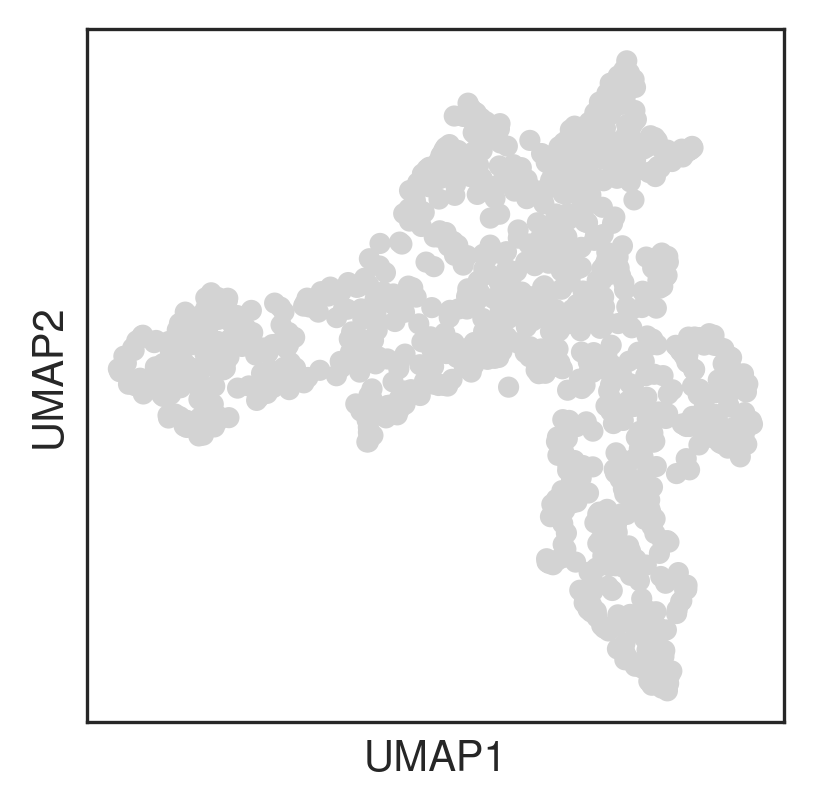

In [8]:
# Load spatial information
img_metadata = utils.preprocess_img(data_path,
                                    sample_id,
                                    adata_index=adata.obs.index,
                                    hchannel=False
                                    )
img, map_info, scalefactor = img_metadata['img'], img_metadata['map_info'], img_metadata['scalefactor']
umap_df = utils.get_umap(adata, display=True)

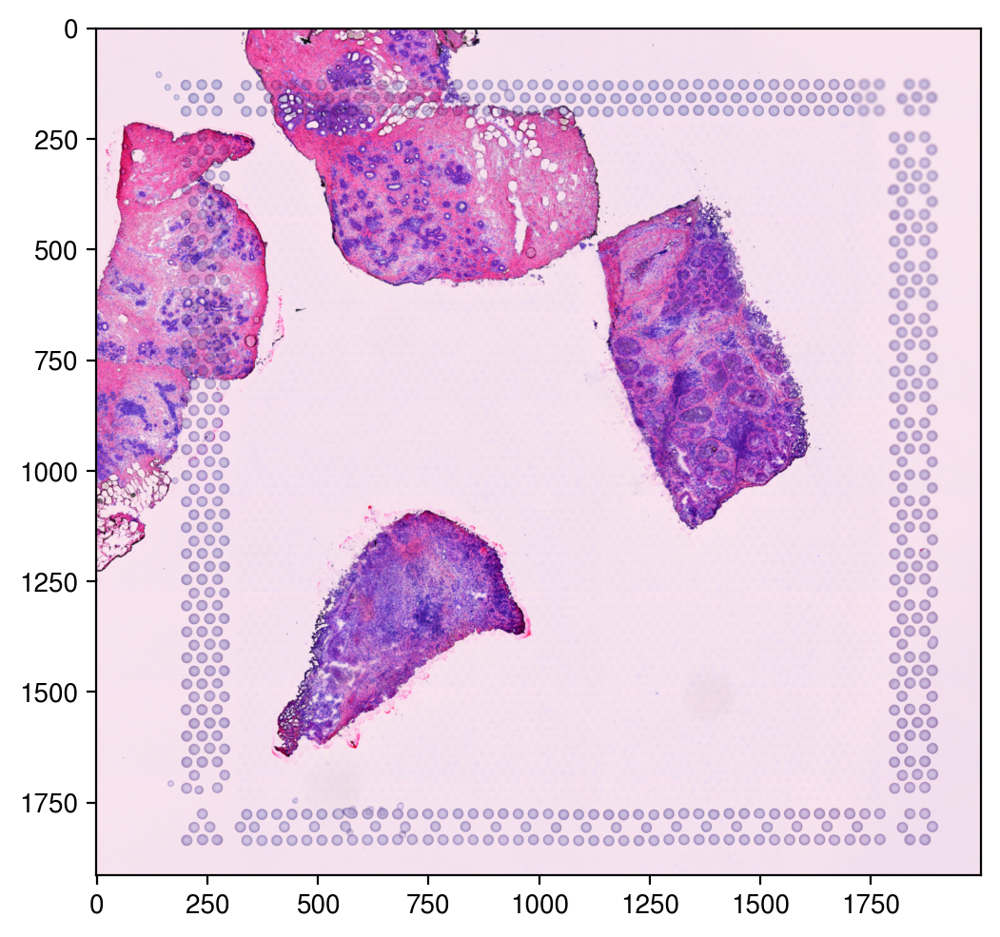

In [26]:
plt.figure(figsize=(6, 6), dpi=200)
plt.imshow(img)
plt.show()

In [27]:
map_info.head()

,array_row,array_col,imagerow,imagecol,sample
AACATTGGTCAGCCGT-1,3,17,1361,2511,CID44971_TNBC
CATCGAATGGATCTCT-1,3,19,1361,2620,CID44971_TNBC
CGGGTTGTAGCTTTGG-1,3,21,1361,2730,CID44971_TNBC
CCTAAGTGTCTAACCG-1,2,22,1266,2784,CID44971_TNBC
TCTGTGACTGACCGTT-1,3,23,1361,2839,CID44971_TNBC


### (2). Preprocessing (finding anchor spots)
- Identify anchor spot locations.

Instantiate parameters for Starfysh model training:
- Raw & normalized counts after taking highly variable genes
- filtered signature genes
- library size & spatial smoothed library size (log-transformed)
- Anchor spot indices (`anchors_df`) for each cell type & their signature means (`sig_means`)


In [9]:
# Parameters for training
visium_args = utils.VisiumArguments(adata,
                                    adata_normed,
                                    gene_sig,
                                    img_metadata,
                                    n_anchors=60,
                                    window_size=3,
                                    sample_id=sample_id
                                   )

adata, adata_normed = visium_args.get_adata()
anchors_df = visium_args.get_anchors()


[2023-02-21 10:52:48] Subsetting highly variable & signature genes ...
[2023-02-21 10:52:48] Smoothing library size by taking averaging with neighbor spots...
[2023-02-21 10:52:48] Retrieving & normalizing signature gene expressions...
[2023-02-21 10:52:48] Identifying anchor spots (highly expression of specific cell-type signatures)...


Check the dimensions of preprocessed data after selecting the union of highly variable genes & user defined signatures:

In [29]:
adata.shape

(1162, 2590)

- Visualize the spatial data

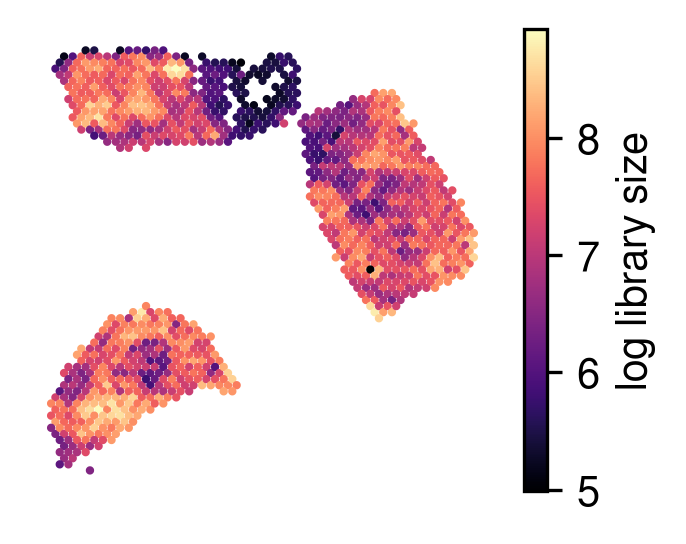

In [30]:
plot_utils.plot_spatial_feature(adata,
                                map_info,
                                visium_args.log_lib,
                                label='log library size'
                               )

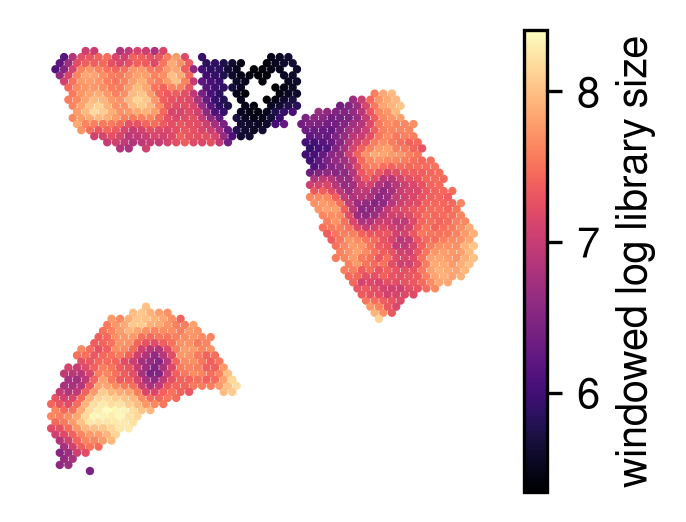

In [31]:
plot_utils.plot_spatial_feature(adata,
                                map_info,
                                visium_args.win_loglib,
                                label='windowed log library size',
                                )

plot raw gene expression:

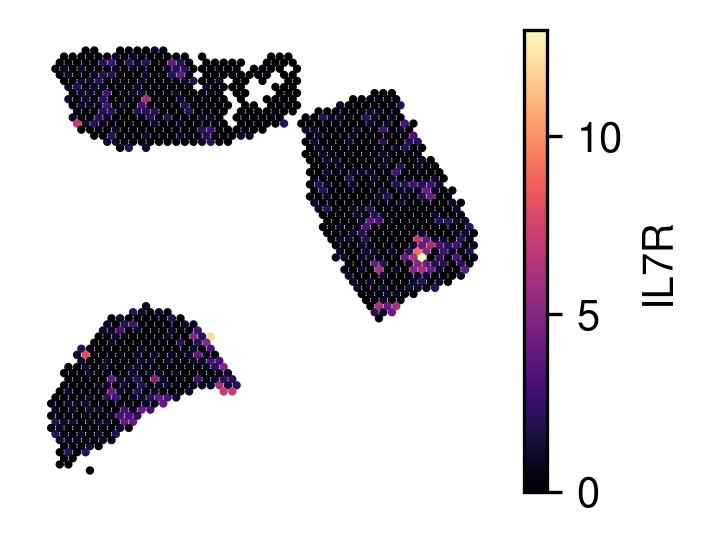

In [32]:
plot_utils.plot_spatial_gene(adata,
                             map_info,
                             gene_name='IL7R')

- Visualize anchor spots

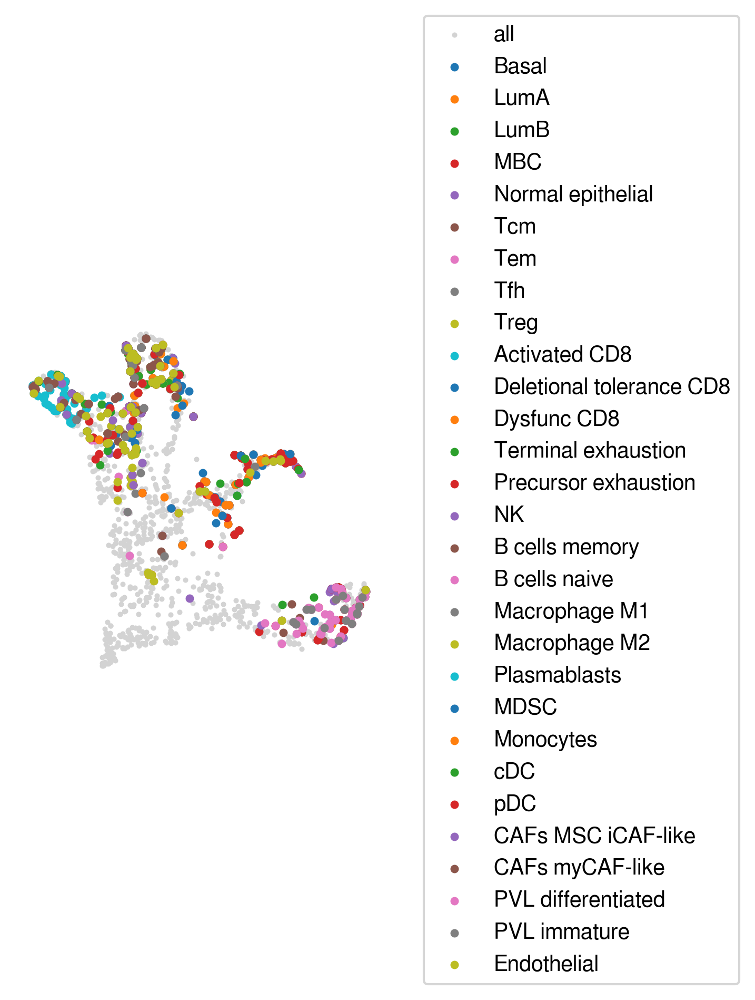

In [33]:
plot_utils.plot_anchor_spots(umap_df,
                             visium_args.pure_spots,
                             visium_args.sig_mean,
                             bbox_x=2
                            )

### (3). Optional: Archetypal Analysis
Overview:
If users don't provide annotated gene signature sets with cell types, Starfysh identifies candidates for cell types via archetypal analysis (AA). The underlying assumption is that the geometric "extremes" are identified as the purest cell types, whereas all other spots are mixture of the "archetypes". If the users provide the gene signature sets, they can still optionally apply AA to refine marker genes and update anchor spots for known cell types. In addition, AA can identify & assign potential novel cell types / states. Here are the features provided by the optional archetypal analysis:
- Finding archetypal spots & assign 1-1 mapping to their closest anchor spot neighbors
- Finding archetypal marker genes & append them to marker genes of annotated cell types
- Assigning novel cell type / cell states as the most distant archetypes

Overall, Starfysh provides the archetypal analysis as a complementary toolkit for automatic cell-type annotation & signature gene completion:
1. *If signature genes aren't provided:* <br><br>Archetypal analysis defines the geometric extrema of the data as major cell types with corresponding marker genes.<br><br>

2. *If signature genes are provided with fine-grained cell types*: <br><br>Users can skip this section and use only the signature priors<br><br>

3. *If signature genes are provided with potential incomplete annotations*: <br><br>Archetypal analysis can be applied to
    a. Refine signatures of certain cell types
    b. Find novel cell types / states that haven't been provided from the input signature

#### If signature genes aren't provided

Note: <br>
- Intrinsic Dimension (ID) estimator is implemented to estimate the lower-bound for the number of archetypes $k$, followed by elbow method with iterations to identify the optimal $k$. By default, a [conditional number](https://scikit-dimension.readthedocs.io/en/latest/skdim.id.FisherS.html) is set as 30; if you believe there are potentially more / fewer cell types, please increase / decrease `cn` accordingly.

Major cell types & corresponding markers are represented by the inferred archetypes:<br><br>



```Python
aa_model = AA.ArchetypalAnalysis(adata_orig=adata_normed)
archetype, arche_dict, major_idx, evs = aa_model.compute_archetypes(r=40)

# (1). Find archetypal spots & archetypal clusters
arche_df = aa_model.find_archetypal_spots(major=True)

# (2). Define "signature genes" as marker genes associated with each archetypal cluster
gene_sig = aa_model.find_markers(n_markers=30, display=False)
gene_sig.head()
```


#### If signature genes are provided with fine-grained cell types

Users can skip the section & deconvolve with signature as priors

#### If signature genes are provided

**In this tutorial, we'll show an example to append marker genes from the best-aligned archetypes to given cell type(s).**

In [34]:
aa_model = AA.ArchetypalAnalysis(adata_orig=adata_normed)
archetype, arche_dict, major_idx, evs = aa_model.compute_archetypes(r=40)
# (1). Find archetypal spots & archetypal clusters
arche_df = aa_model.find_archetypal_spots(major=True)

# (2). Find marker genes associated with each archetypal cluster
markers_df = aa_model.find_markers(n_markers=30, display=False)

# (3). Map archetypes to closest anchors (1-1 per cell type)
map_df, map_dict = aa_model.assign_archetypes(anchors_df)

# (4). Optional: Find the most distant archetypes that are not assigned to any annotated cell types
distant_arches = aa_model.find_distant_archetypes(anchors_df, n=3)

[2023-02-02 16:54:41] Computing intrinsic dimension to estimate k...


30 components are retained using conditional_number=30.00


[2023-02-02 16:54:41] Estimating lower bound of # archetype as 12...
[2023-02-02 16:54:54] Calculating UMAPs for counts + Archetypes...
[2023-02-02 16:54:58] Calculating UMAPs for counts + Archetypes...
[2023-02-02 16:55:00] 0.6918 variance explained by raw archetypes.
Merging raw archetypes within 40 NNs to get major archetypes
[2023-02-02 16:55:00] Finding 20 nearest neighbors for each archetype...
[2023-02-02 16:55:00] Finding 30 top marker genes for each archetype...


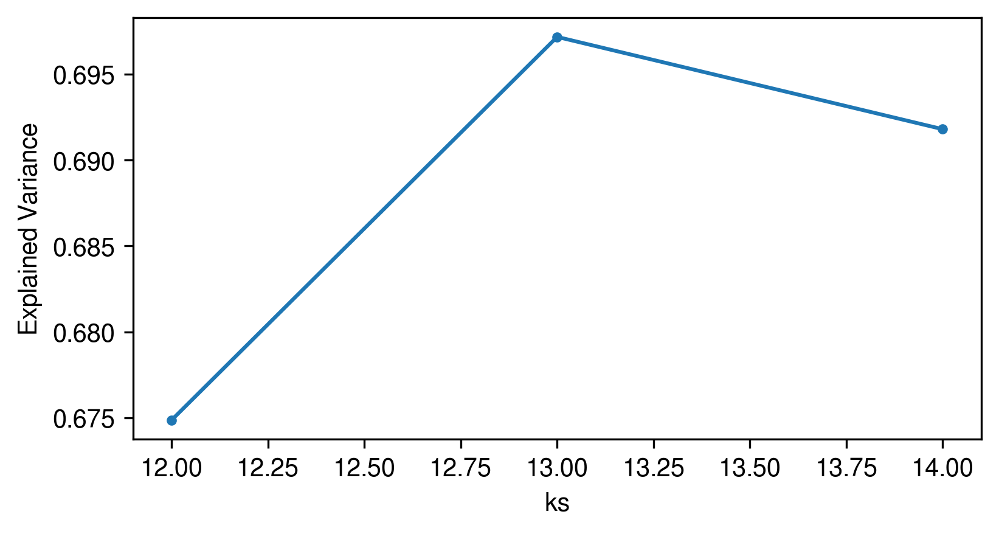

In [35]:
plot_utils.plot_evs(evs, kmin=aa_model.kmin)

- Visualize archetypes

[2023-02-02 16:55:02] No handles with labels found to put in legend.


(<Figure size 1800x1200 with 1 Axes>, <AxesSubplot:>)

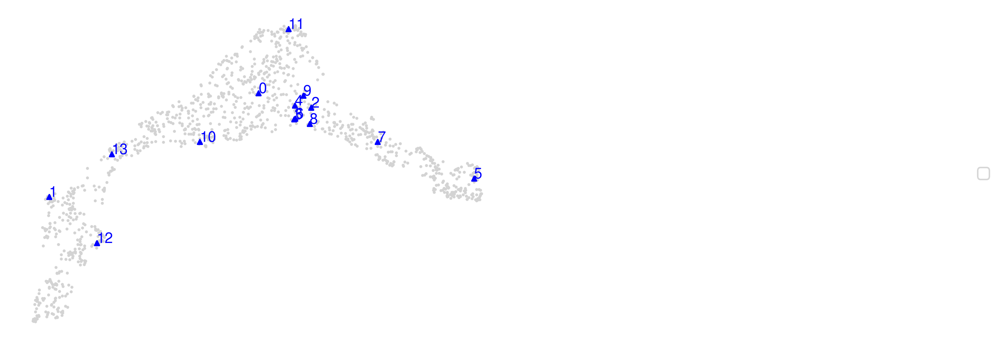

In [36]:
aa_model.plot_archetypes(do_3d=False, major=True, disp_cluster=False)

-  Visualize overlapping ratio between archetypal & anchor spots:


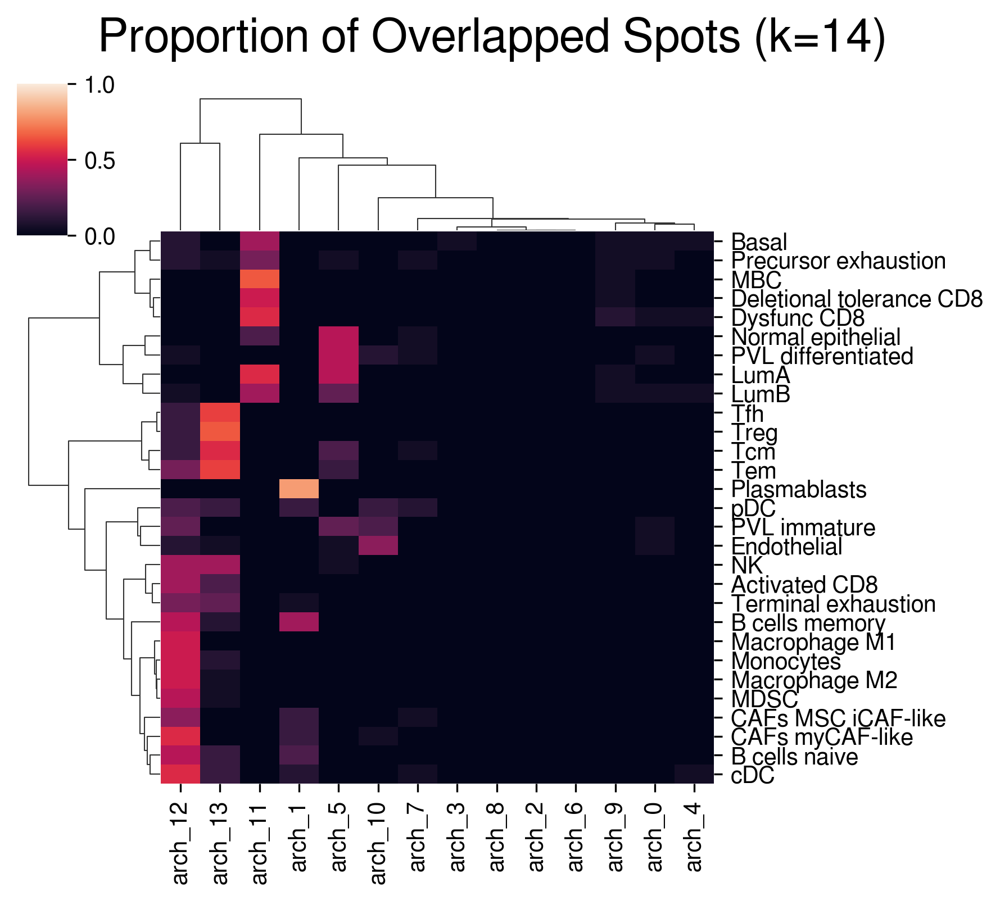

In [37]:
aa_model.plot_mapping(map_df)

-  Application: appending marker genes
   Append archetypal marker genes with the best-aligned anchors:

In [38]:
visium_args = utils.refine_anchors(
    visium_args,
    aa_model,
    thld=0.8,
    n_genes=10,
    n_iters=1
)

# Get updated adata & signatures
adata, adata_normed = visium_args.get_adata()
gene_sig = visium_args.gene_sig
cell_types = gene_sig.columns

[2023-02-02 16:55:02] Finding 50 top marker genes for each archetype...
[2023-02-02 16:55:04] Recalculating anchor spots (highly expression of specific cell-type signatures)...


Refining round 1...
appending 10 genes in arch_1 to Plasmablasts...


## Run starfysh


We perform `n_repeat` random restarts and select the best model with lowest loss for parameter `c` (inferred cell-type proportions):


### (1). Model parameters

In [10]:
n_repeats = 1
epochs = 200
patience = 50
device = torch.device('cuda')


### (2). Model training

#### Base Starfysh deconvolution with ST count matrix (without PoE)

In [11]:
# Run models
model, loss = utils.run_starfysh(visium_args,
                                 n_repeats=n_repeats,
                                 epochs=epochs,
                                 patience=patience,
                                 device=device
                                )

[2023-02-21 10:53:02] Running Starfysh with 1 restarts, choose the model with best parameters...
[2023-02-21 10:53:02]  ===  Restart Starfysh 1 === 

[2023-02-21 10:53:04] Initializing model parameters...
[2023-02-21 10:53:13] Epoch[10/200], train_loss: 2757.1400, train_reconst: 1549.9088, train_u: 4.7961,train_z: 18.4716,train_c: 1154.8984,train_n: 33.8611
[2023-02-21 10:53:22] Epoch[20/200], train_loss: 2473.3621, train_reconst: 1495.9336, train_u: 5.5051,train_z: 17.9046,train_c: 928.7905,train_n: 30.7333
[2023-02-21 10:53:30] Epoch[30/200], train_loss: 2330.8574, train_reconst: 1471.7674, train_u: 6.2065,train_z: 18.1975,train_c: 810.6913,train_n: 30.2012
[2023-02-21 10:53:39] Epoch[40/200], train_loss: 2247.9081, train_reconst: 1440.6176, train_u: 6.9305,train_z: 18.5305,train_c: 759.2430,train_n: 29.5171
[2023-02-21 10:53:48] Epoch[50/200], train_loss: 2324.9906, train_reconst: 1419.3684, train_u: 7.8082,train_z: 18.8234,train_c: 857.7535,train_n: 29.0453
[2023-02-21 10:53:58] Ep

#### Starfysh deconvolution with histology integration (PoE)

We perform integrative inference of both gene expression and histology matrices with Products of Expert model, which projects different data modalities into the joint latent space to aid deconvolution with actual spatial information.

In [40]:
model_poe, loss_poe = utils.run_starfysh(visium_args,
                                         n_repeats=n_repeats,
                                         epochs=epochs,
                                         patience=patience,
                                         poe=True,
                                         device=device)

[2023-02-02 16:55:04] Running Starfysh with 3 restarts, choose the model with best parameters...
[2023-02-02 16:55:04]  ===  Restart Starfysh 1 === 

[2023-02-02 16:55:05] Initializing model parameters...
[2023-02-02 16:55:18] Epoch[10/100], train_loss: 5055468.3868, train_reconst: 1632.3706, train_z: 19.4239,train_c: 939.7360,train_n: 33.0986
[2023-02-02 16:55:31] Epoch[20/100], train_loss: 1740744.8763, train_reconst: 1570.6110, train_z: 18.8870,train_c: 789.6997,train_n: 30.7675
[2023-02-02 16:55:44] Epoch[30/100], train_loss: 597910.3771, train_reconst: 1547.2827, train_z: 17.8570,train_c: 652.0726,train_n: 28.9048
[2023-02-02 16:55:57] Epoch[40/100], train_loss: 331298.4913, train_reconst: 1530.0716, train_z: 17.3062,train_c: 621.8278,train_n: 27.3120
[2023-02-02 16:56:10] Epoch[50/100], train_loss: 293322.8296, train_reconst: 1496.5556, train_z: 16.9006,train_c: 607.6666,train_n: 25.8764
[2023-02-02 16:56:23] Epoch[60/100], train_loss: 269664.3226, train_reconst: 1492.6859, train

### (3). Downstream analysis

#### Parse Starfysh inference output (*without PoE*)

In [12]:
adata, adata_normed = visium_args.get_adata()
inference_outputs, generative_outputs = sf_model.model_eval(model,
                                                            adata,
                                                            visium_args,
                                                            poe=False,
                                                            device=device)

#### Visualize starfysh deconvolution results

##### Gene sig mean vs. inferred prop


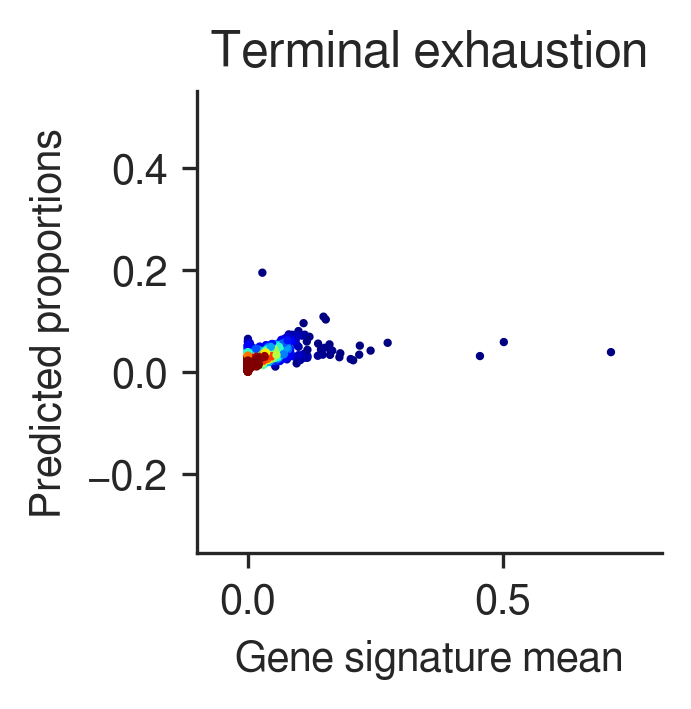

In [13]:
n_cell_types = gene_sig.shape[1]
idx = np.random.randint(0, n_cell_types)
post_analysis.gene_mean_vs_inferred_prop(inference_outputs,
                                         visium_args,
                                         idx=idx
                                        )

##### Spatial visualizations:

Inferred density on Spatial map:

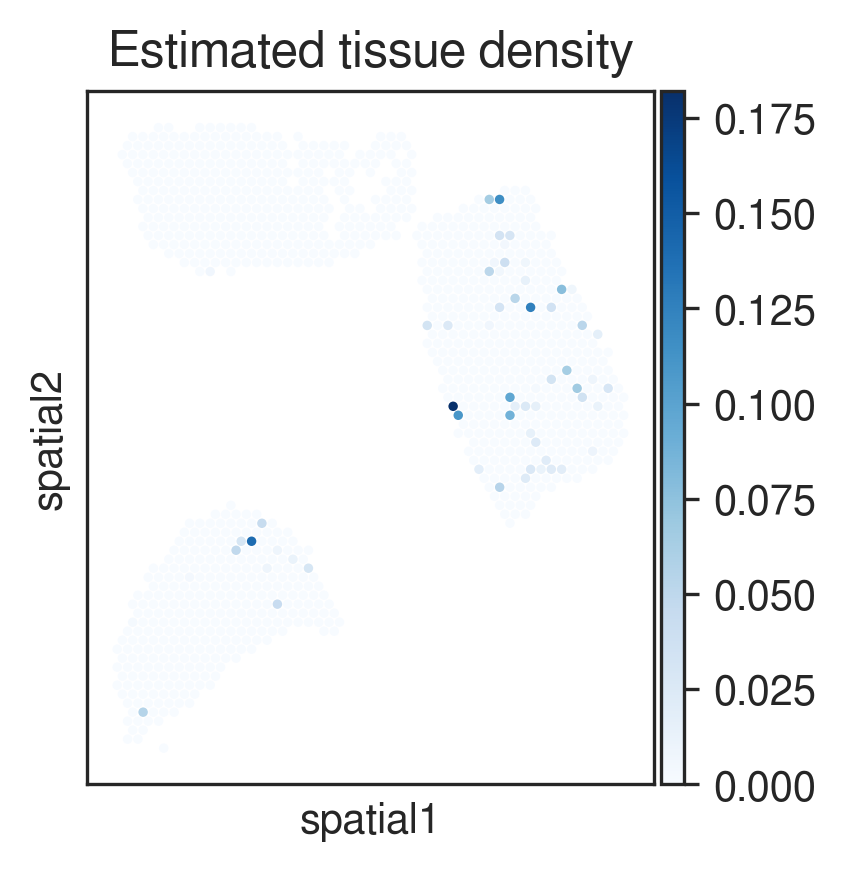

In [14]:
plot_utils.pl_spatial_inf_feature(adata, feature='ql_m', cmap='Blues')

**Inferred cell-type proportions (spatial map):**

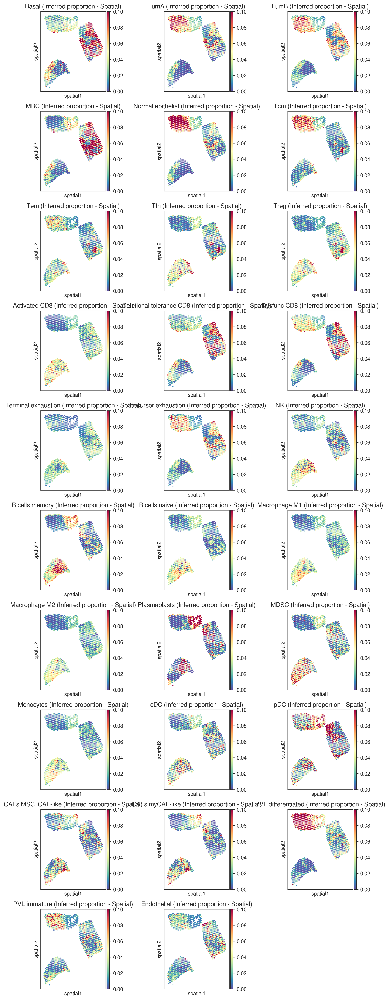

In [15]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qc_m',
                                  # To display for specific cell types:
                                  # factor = cell type or factor = [cell type1, ...]
                                  vmax=0.1)

**Inferred cell-type proportions on Z-space (UMAP):**

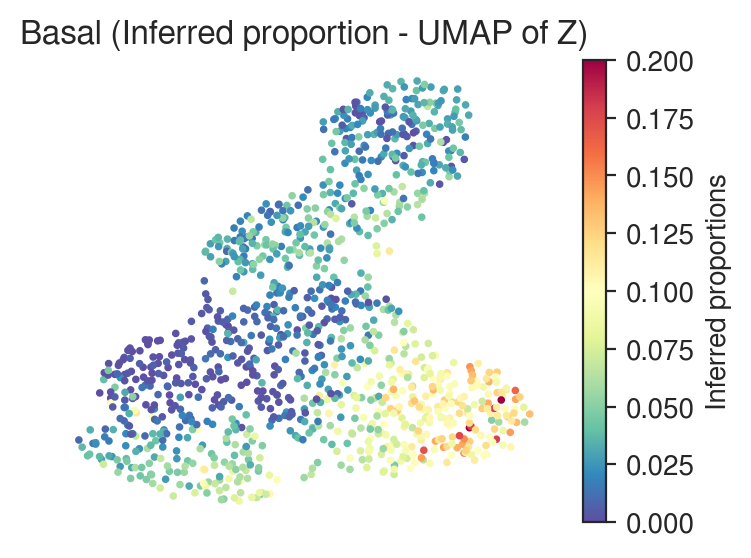

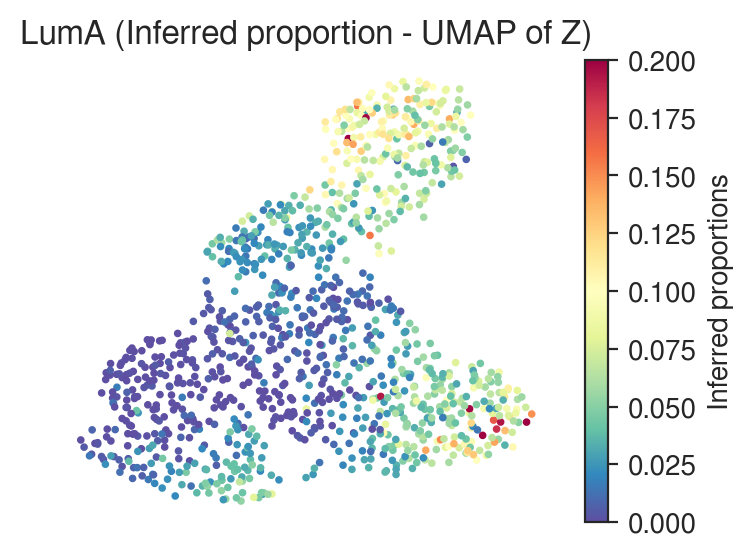

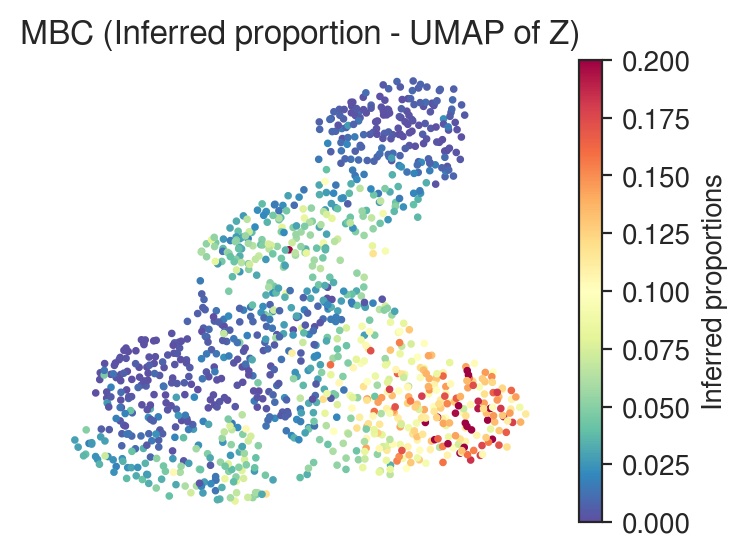

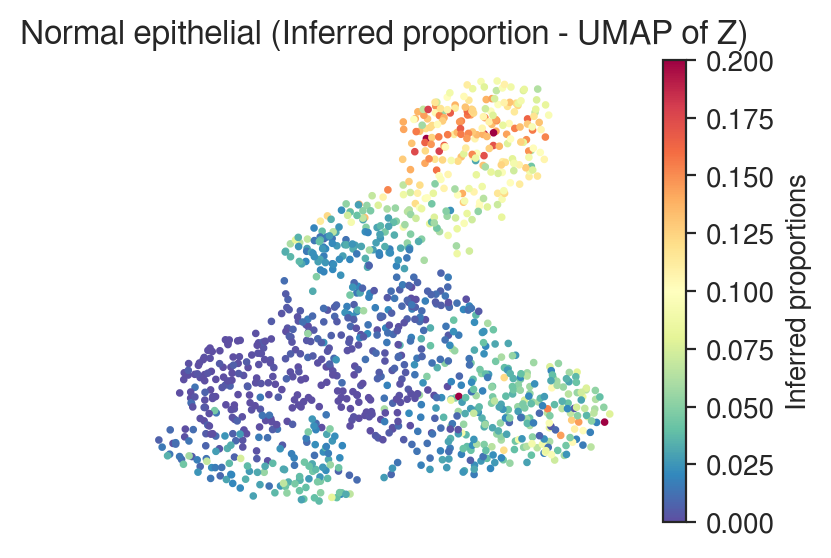

In [16]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qz_m',
                                  # To display for specific cell types:
                                  # factor = Cell type or factor = [Cell type1, ...]
                                  factor=['Basal', 'LumA', 'MBC', 'Normal epithelial'],
                                  spot_size=3,
                                  vmax=0.2)


 ##### Infer cell-type specific expressions for each spot

In [17]:
pred_exprs = sf_model.model_ct_exp(model,
                                   adata,
                                   visium_args,
                                   device=device)

Plot spot-level expression of `IL7R` from *Effector Memory T cells (Tem)*:


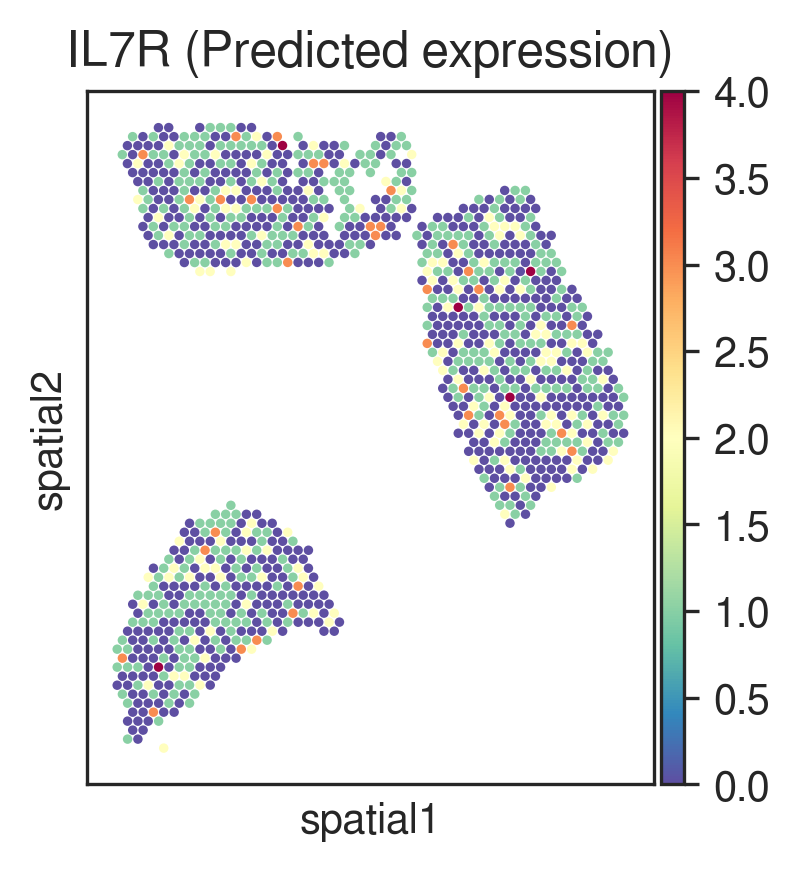

In [18]:
sample_gene = 'IL7R'
sample_cell_type = 'Tem'

plot_utils.pl_spatial_inf_gene(adata,
                               factor=sample_cell_type,
                               feature=sample_gene)


#### Parse Starfysh inference output (*Starfysh w/ PoE*)

In [43]:
inference_outputs_poe, generative_outputs_poe = sf_model.model_eval(model_poe,
                                                                    adata,
                                                                    visium_args,
                                                                    poe=True,
                                                                    device=device)


#### Visualize starfysh deconvolution results (w/ PoE)

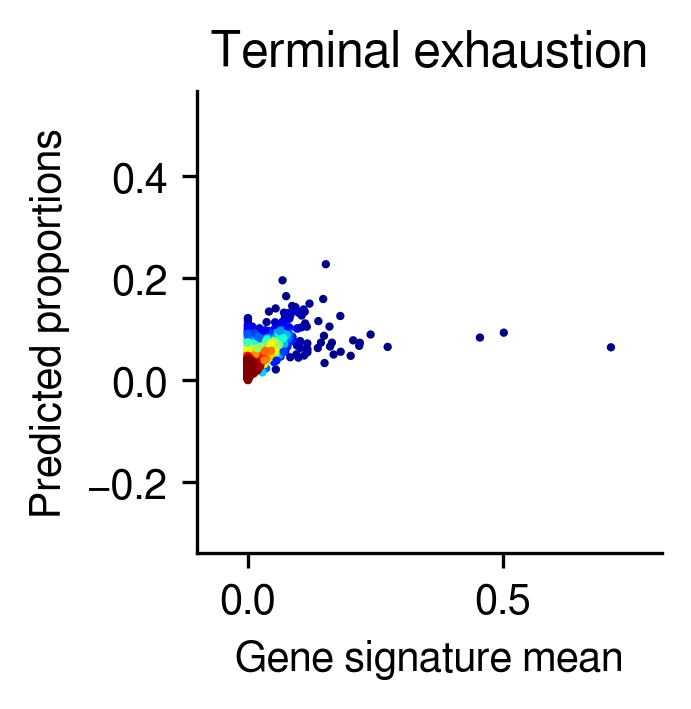

In [45]:
n_cell_types = gene_sig.shape[1]
idx = np.random.randint(0, n_cell_types)
post_analysis.gene_mean_vs_inferred_prop(inference_outputs_poe,
                                         visium_args,
                                         idx=idx
                                        )

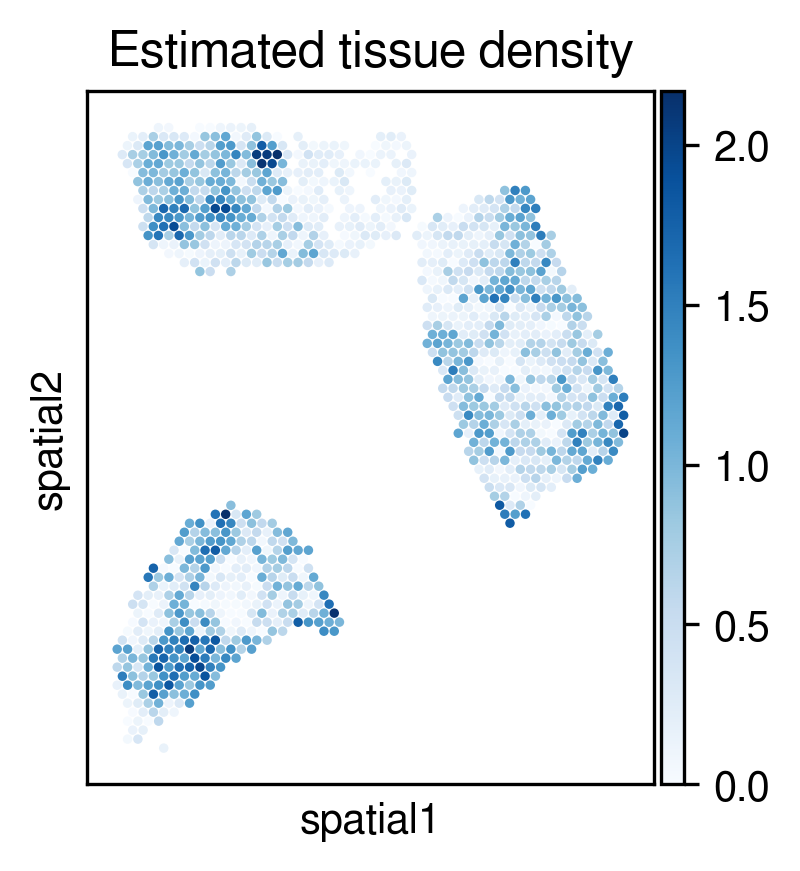

In [46]:
plot_utils.pl_spatial_inf_feature(adata, feature='ql_m', cmap='Blues')

**Inferred cell-type proportions (spatial map):**

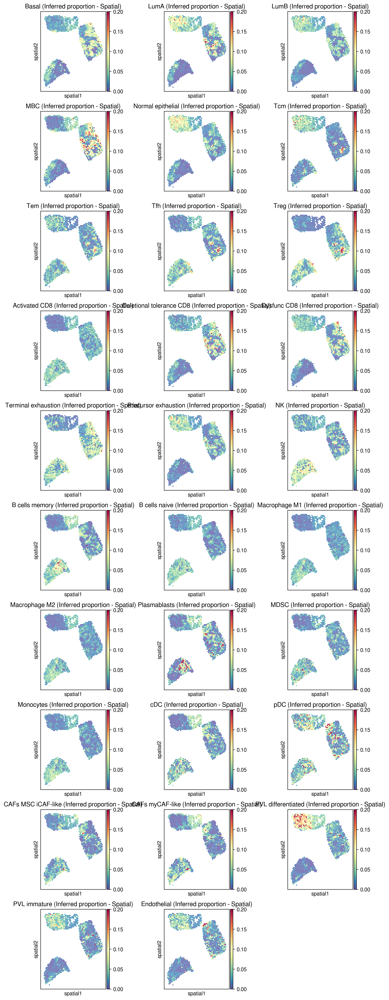

In [47]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qc_m',
                                  # To display for specific cell types:
                                  # factor = cell type or factor = [cell type1, ...]
                                  vmax=0.2)


**Inferred cell-type proportions on Z-space (UMAP):**

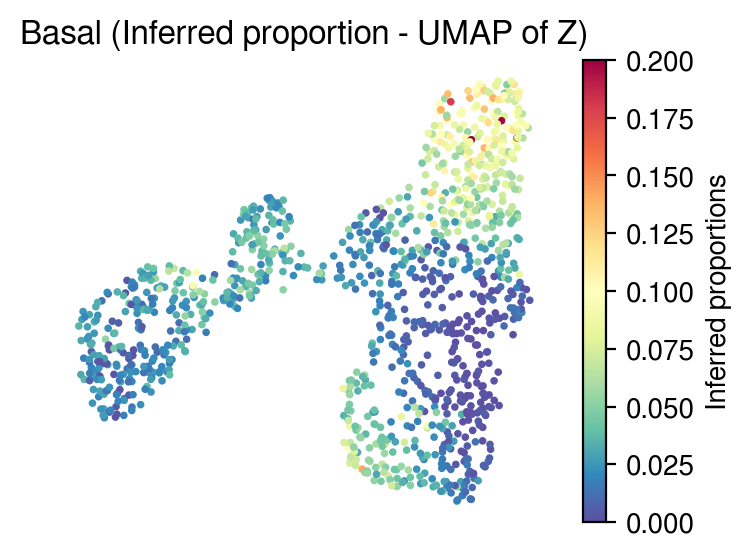

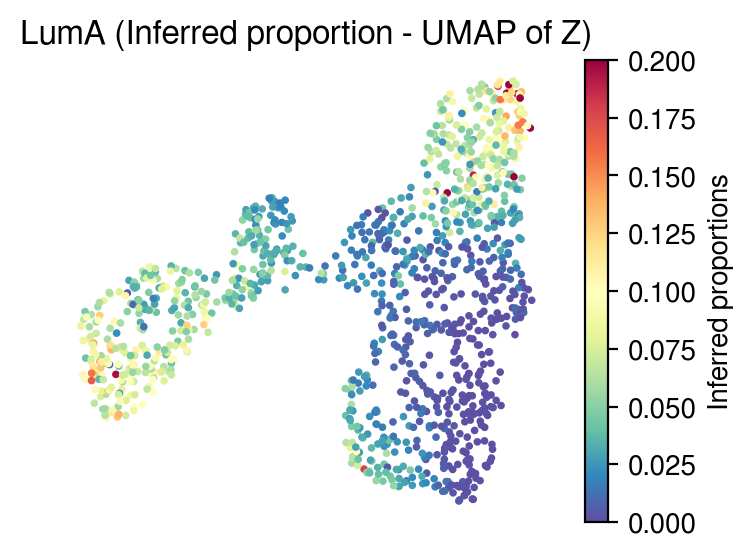

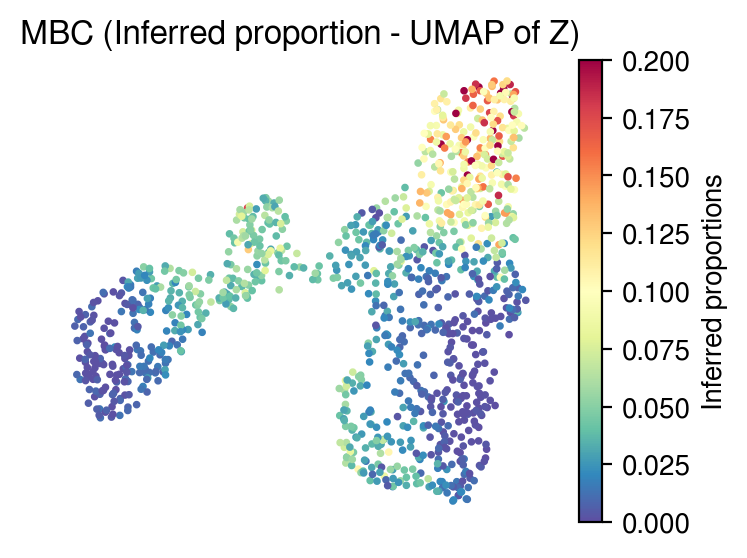

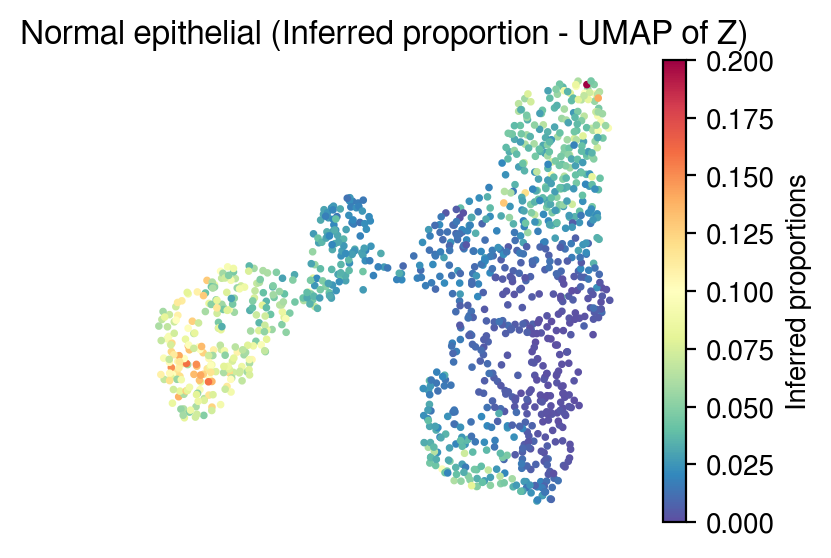

In [48]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qz_m',
                                  # To display for specific cell types:
                                  # factor = Cell type or factor = [Cell type1, ...]
                                  factor=['Basal', 'LumA', 'MBC', 'Normal epithelial'],
                                  vmax=0.2)

---